<h1><br>¿Las personas que dedican mucho tiempo jugando League of Legends son mas propensas a desarrollar un transtorno mental?<br></h1>
<p class="texto-justificado">El tiempo que se pasa en línea y/o jugando videojuegos ha aumentado en la vida diaria de un
gran número de personas en todo el mundo.
En consecuencia, se han expresado preocupaciones con respecto al comportamiento adictivo, como equipo queremos ver a través de gráficas estos distintos trastornos. 
    
Decidimos escoger el videojuego League of Legends, ya que es el juego con mayor cantidad de personas jugando actualmente. Con tasas de más de 10 millones de jugadores constantes al mes en todo el mundo.
    
Durante el siguiente informe, trataremos de analizar si la afirmación antes mencionada se puede demostrar con los datos recolectados en el foro de Reddit. Evitando caer en sesgos que no puedan ser demostrados usando una visión empirica y guiada por dichos datos.
</p>

<strong>Fuentes:</strong>
   <i>La fuente de los datos los obtuvimos de: https://www.kaggle.com/divyansh22/online-gaming-anxiety-data  <br>
   Donde la investigación junto a su profundidad, lo pudimos encontrar en: https://osf.io/vnbxk/?view_only=4c54da075e164ea2a5329f5669d03c41 (revisar PDF GamingStudy_Survey, para entender a profundidad el contexto de la investigación realizada
</i>

Equipo compuesto por: <br>
<strong>José Cabrera <br>
José Oteiza<br>
José Vega<br>
</strong>

<h2><br>Los acronimos que se estarán usando en este informe, significan lo siguiente:</br></h2>
<p><strong>GAD</strong> = Generalized Anxiety Disorder</p>
<p><strong>SWL</strong> = Satisfaction with Life Scale</p>
<p><strong>SPIN</strong> = Social Phobia Inventory</p>
<p><strong>SINS</strong> = Single Item Narcissism Scale</p>

<p>Diccionario de datos : https://docs.google.com/document/d/1r9xMsi-PG81wwyNnhavtXlLbguvjUsh_ETsrFu2Z4Vk/edit </p>

<h3>Comenzamos a importar las librerias que vamos a estar requiriendo junto al dataset que contiene todos los datos que necesitamos</h3>

In [434]:
#Manipulacion de datos
import numpy as np
import pandas as pd
import pandas_profiling

#Estadistica
from scipy.stats import norm

#Visualizacion
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as dataFaltante

%matplotlib inline

df_gaming = pd.read_csv("./Datasets/Gaming-anxiety.csv", encoding= 'unicode_escape')
df_gaming

,S. No.,Timestamp,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7,GADE,...,Birthplace,Residence,Reference,Playstyle,accept,GAD_T,SWL_T,SPIN_T,Residence_ISO3,Birthplace_ISO3
0,1,42052.00437,0,0,0,0,1,0,0,Not difficult at all,...,USA,USA,Reddit,Singleplayer,Accept,1,23,5.0,USA,USA
1,2,42052.00680,1,2,2,2,0,1,0,Somewhat difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,8,16,33.0,USA,USA
2,3,42052.03860,0,2,2,0,0,3,1,Not difficult at all,...,Germany,Germany,Reddit,Singleplayer,Accept,8,17,31.0,DEU,DEU
3,4,42052.06804,0,0,0,0,0,0,0,Not difficult at all,...,USA,USA,Reddit,Multiplayer - online - with online acquaintanc...,Accept,0,17,11.0,USA,USA
4,5,42052.08948,2,1,2,2,2,3,2,Very difficult,...,USA,South Korea,Reddit,Multiplayer - online - with strangers,Accept,14,14,13.0,KOR,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,14246,42057.75678,1,0,0,1,0,1,1,Not difficult at all,...,France,France,Reddit,Multiplayer - online - with strangers,Accept,4,28,7.0,FRA,FRA
13460,14247,42057.81185,3,3,3,3,2,3,3,Extremely difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,20,23,25.0,USA,USA
13461,14248,42058.16964,0,0,0,0,0,0,0,Not difficult at all,...,Norway,Norway,Reddit,Multiplayer - online - with real life friends,Accept,0,32,10.0,NOR,NOR
13462,14249,42058.24420,3,2,1,3,0,1,3,Somewhat difficult,...,Canada,Canada,Reddit,Singleplayer,Accept,13,16,32.0,CAN,CAN


En este dataset podemos encontrar la recopilación exautativa mediante encuestas realizada por la Universidad de Ludwig-Maximilians-Universität München. Donde le preguntaron a mas de 13000 personas que dedican tiempo de sus vidas a jugar videojuegos.

Considerando la abundante información que se tiene, debemos proceder a realizar un EDA (Exploratory Data Analysis). Para encontrar las variables más importantes para responder la pregunta antes mencionada. TODO: COLOCAR MARKDOWNS

<h3>Analizamos con la herramienta missingno los datos en su totalidad con una gráfica</h3>

<AxesSubplot:>

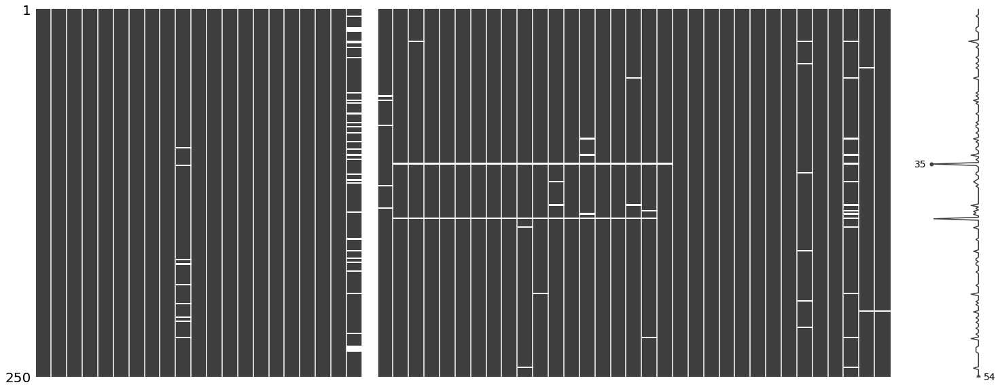

In [435]:
dataFaltante.matrix(df_gaming.sample(250))

Esta gráfica nos muestra la cantidad de datos faltantes que hay en todas las columnas del dataset.

<h3>Realizamos la limpieza de datos. Filtramos los registros de la columna "Game", solo queremos los que tienen el valor de "League of Legends"</h3>

In [436]:
# Solo nos enfocaremos en el juego League of Legends
df_league_of_legends = df_gaming[df_gaming['Game'] == "League of Legends"]

# Quitamos los outlayers
df_league_of_legends = df_league_of_legends[df_gaming['Hours'] < 300]

# Solo dejamos las siguientes categorias de whyplay: [having fun, improving, winning whyplay, relaxing]
df_league_of_legends = df_league_of_legends[
    (df_gaming['whyplay'] == "having fun") |
    (df_gaming['whyplay'] == "improving") |
    (df_gaming['whyplay'] == "winning whyplay") |
    (df_gaming['whyplay'] == "relaxing")
    ]

# SPIN_T

df_league_of_legends.shape

(9072, 55)

In [437]:
pandas_profiling.ProfileReport(df_league_of_legends)


Render HTML: 100%|██████████| 1/1 [00:07<00:00,  7.46s/it]


<h3>Ahora procedemos a sacar los feature que no nos brinda la información necesaria para la investigación</h3>

In [438]:
df_league_of_legends = df_league_of_legends.drop(columns=[
    'earnings',
    'Reference',
    'accept',
    'Birthplace_ISO3',
    'Residence_ISO3',
    'Timestamp',
    'Birthplace',
    'highestleague',
    'streams',
    'S. No.',
    'Gender',
    'GAD1',          
    'GAD2',          
    'GAD3',          
    'GAD4',          
    'GAD5',          
    'GAD6',     
    'GAD7',          
    'GADE',          
    'SWL1',          
    'SWL2',          
    'SWL3',          
    'SWL4',         
    'SWL5',
    'SPIN1',         
    'SPIN2',         
    'SPIN3',         
    'SPIN4',         
    'SPIN5',         
    'SPIN6',         
    'SPIN7',         
    'SPIN8',         
    'SPIN9',         
    'SPIN10',        
    'SPIN11',        
    'SPIN12',        
    'SPIN13',        
    'SPIN14',        
    'SPIN15',        
    'SPIN16',        
    'SPIN17',
])

<h3>Procedemos a sacar todos los registros que tienen uno de los campos vacio (NaN)</h3>
<p>Podemos ver como 1808 registros fueron eliminados del DataFrame 
(Se podría considerar rellenar esos campos con la mediana)</p>

In [439]:
df_league_of_legends = df_league_of_legends.dropna()
df_league_of_legends

,Game,Platform,Hours,whyplay,League,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,League of Legends,PC,25.0,having fun,Gold,1.0,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,33,3.0
27,League of Legends,PC,5.0,having fun,Bronze,3.0,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,5,26,31.0
33,League of Legends,PC,9.0,improving,Silver 4,4.0,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,26,39.0
35,League of Legends,PC,7.0,having fun,Gold,2.0,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,21,29.0
48,League of Legends,PC,25.0,improving,Unranked - Low ELO,3.0,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,11,10,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13450,League of Legends,PC,15.0,having fun,gold 3,2.0,21,Student at college / university,Bachelor (or equivalent),Croatia,Multiplayer - online - with real life friends,3,28,3.0
13452,League of Legends,PC,10.0,having fun,Silver V,1.0,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,2,17,23.0
13456,League of Legends,PC,12.0,relaxing,Gold 3,3.0,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,5,31,6.0
13457,League of Legends,PC,15.0,improving,silver,1.0,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,7,5,33.0


<h3>Se pasaron todos los valores decimales a valor de número entero</h3>

In [440]:
float_col = df_league_of_legends.select_dtypes(include=['float64'])

for col in float_col:
    df_league_of_legends[col] = df_league_of_legends[col].astype(int)

df_league_of_legends

,Game,Platform,Hours,whyplay,League,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,League of Legends,PC,25,having fun,Gold,1,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,33,3
27,League of Legends,PC,5,having fun,Bronze,3,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,5,26,31
33,League of Legends,PC,9,improving,Silver 4,4,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,26,39
35,League of Legends,PC,7,having fun,Gold,2,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,21,29
48,League of Legends,PC,25,improving,Unranked - Low ELO,3,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,11,10,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13450,League of Legends,PC,15,having fun,gold 3,2,21,Student at college / university,Bachelor (or equivalent),Croatia,Multiplayer - online - with real life friends,3,28,3
13452,League of Legends,PC,10,having fun,Silver V,1,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,2,17,23
13456,League of Legends,PC,12,relaxing,Gold 3,3,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,5,31,6
13457,League of Legends,PC,15,improving,silver,1,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,7,5,33


In [441]:
df_league_of_legends.count()

Game          7640
Platform      7640
Hours         7640
whyplay       7640
League        7640
Narcissism    7640
Age           7640
Work          7640
Degree        7640
Residence     7640
Playstyle     7640
GAD_T         7640
SWL_T         7640
SPIN_T        7640
dtype: int64

### Hacemos una distribucion normal en base a las horas de juego

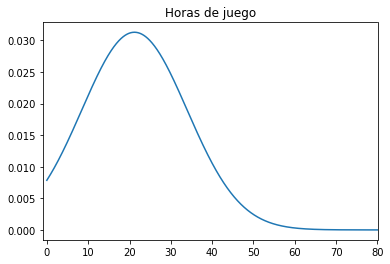

In [442]:
x1=df_league_of_legends['Hours'].min()          #Valor minimo de la columna Hours
x2=df_league_of_legends['Hours'].max()          #Valor maximo de la columna Hours
mean = df_league_of_legends['Hours'].mean()     #Valor promedio de la columna Hours
std = df_league_of_legends['Hours'].std()       #Desviacion estandar de la columna Hours

x_axis = np.arange(x1, x2, 0.001) 

plt.plot(x_axis, norm.pdf(x_axis, mean, std)) 
plt.xlim(-1,80)
plt.title("Horas de juego")
plt.show() 

Esto son los valores de las horas jugadas de todo nuestro dataset.

## Univariado

#### Podemos observar que la cantidad de personas que juegan va disminuyendo mientras avanza su vida laboral y academica

<AxesSubplot:title={'center':'Horas jugadas dependiendo la profesión'}, xlabel='Degree', ylabel='count'>

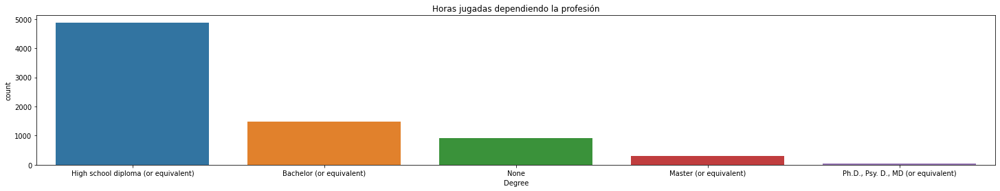

In [443]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas dependiendo la profesión")
sns.countplot(x = df_league_of_legends.Degree.dropna(), order = df_league_of_legends.Degree.value_counts().index)

<AxesSubplot:title={'center':'Horas jugadas'}, xlabel='Hours', ylabel='count'>

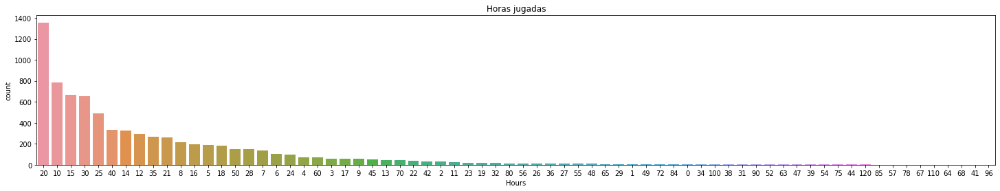

In [444]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas")
sns.countplot(x = df_league_of_legends.Hours.dropna(), order = df_league_of_legends.Hours.value_counts().index)

<AxesSubplot:title={'center':'Ligas pertenecientes a los jugadores de League of Legends'}, xlabel='League', ylabel='count'>

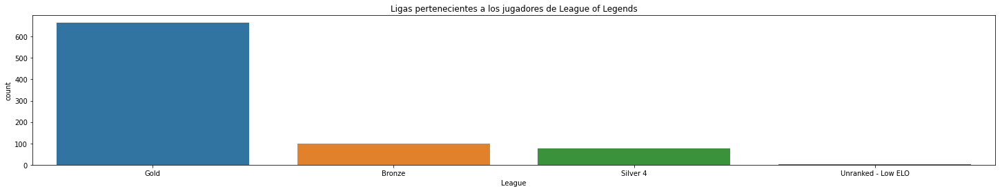

In [445]:
plt.figure(figsize=(25, 4))
plt.title("Ligas pertenecientes a los jugadores de League of Legends")
sns.countplot(x = df_league_of_legends.League.dropna(), order = df_league_of_legends.League[:5].value_counts().index)

<AxesSubplot:title={'center':'Cantidad de Narcisismo'}, xlabel='Narcissism', ylabel='count'>

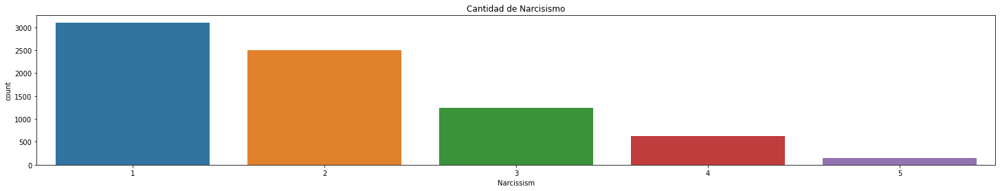

In [446]:
plt.figure(figsize=(25, 4))
plt.title("Cantidad de Narcisismo")
sns.countplot(x = df_league_of_legends.Narcissism.dropna(), order = df_league_of_legends.Narcissism.value_counts().index)

<AxesSubplot:title={'center':'Horas jugadas'}, xlabel='Work', ylabel='count'>

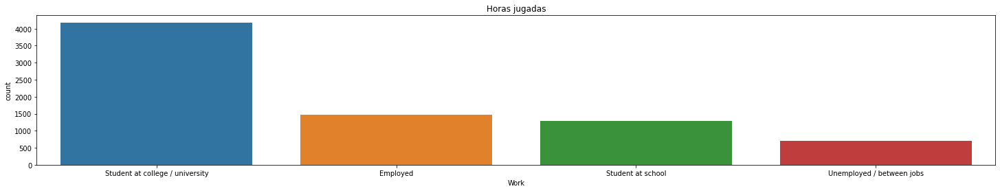

In [447]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas")
sns.countplot(x = df_league_of_legends.Work.dropna(), order = df_league_of_legends.Work.value_counts().index)

<AxesSubplot:title={'center':'Pa'}, xlabel='Residence', ylabel='count'>

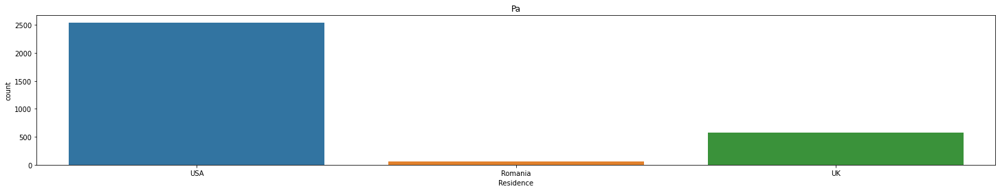

In [448]:
plt.figure(figsize=(25, 4))
plt.title("Pa")
sns.countplot(x = df_league_of_legends.Residence.dropna(), order = df_league_of_legends.Residence[:5].value_counts().index)

<AxesSubplot:title={'center':'Horas jugadas'}, xlabel='Playstyle', ylabel='count'>

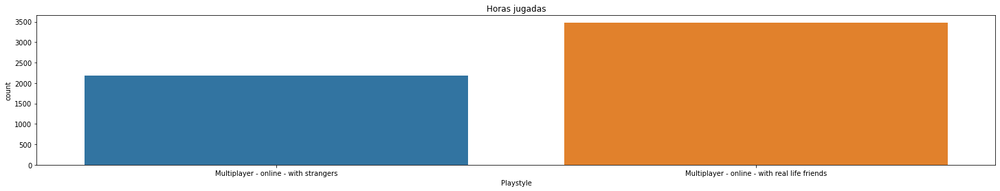

In [449]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas")
sns.countplot(x = df_league_of_legends.Playstyle.dropna(), order = df_league_of_legends.Playstyle[:5].value_counts().index)

<AxesSubplot:title={'center':'Horas jugadas'}, xlabel='GAD_T', ylabel='count'>

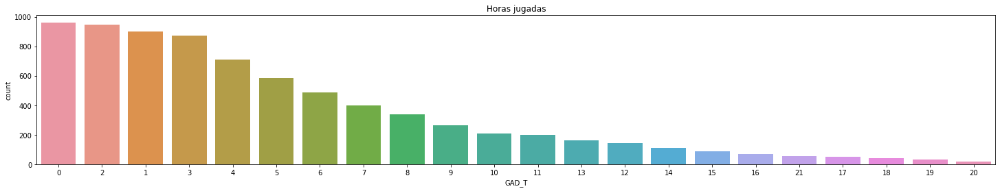

In [450]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas")
sns.countplot(x = df_league_of_legends.GAD_T.dropna(), order = df_league_of_legends.GAD_T.value_counts().index)

<AxesSubplot:title={'center':'Horas jugadas'}, xlabel='SWL_T', ylabel='count'>

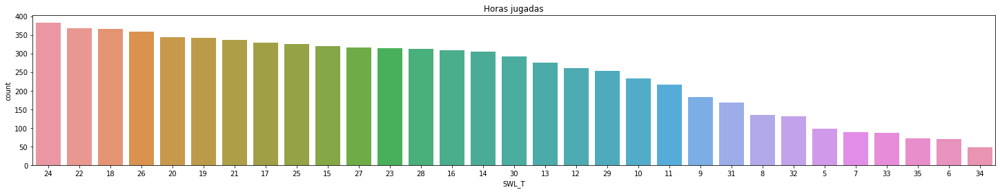

In [451]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas")
sns.countplot(x = df_league_of_legends.SWL_T.dropna(), order = df_league_of_legends.SWL_T.value_counts().index)

<AxesSubplot:title={'center':'Horas jugadas'}, xlabel='SPIN_T', ylabel='count'>

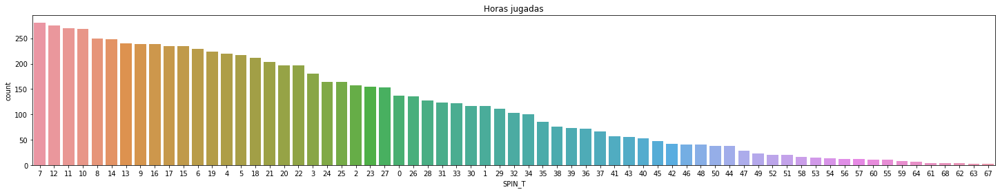

In [452]:
plt.figure(figsize=(25, 4))
plt.title("Horas jugadas")
sns.countplot(x = df_league_of_legends.SPIN_T.dropna(), order = df_league_of_legends.SPIN_T.value_counts().index)

#### El dispositivo de juego mas usado es el PC, esto es paralelo con el juego mas jugado. dado que solo se puede en computador

<AxesSubplot:title={'center':'Dispositivos más usados'}, xlabel='Platform', ylabel='count'>

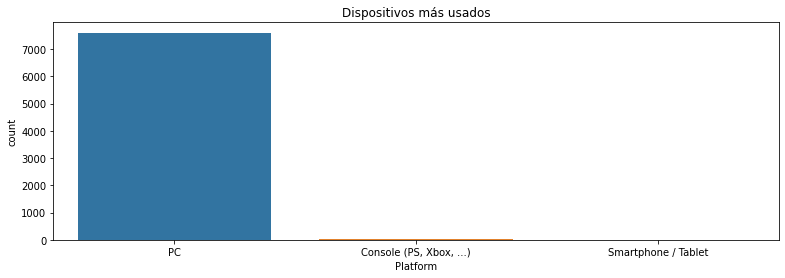

In [453]:
plt.figure(figsize=(13, 4))
plt.title("Dispositivos más usados")
sns.countplot(x = df_league_of_legends.Platform.dropna(), order = df_league_of_legends.Platform.value_counts().index)

### El motivo por el cual juegan las personas puede afectar directamente con trastornos de todo tipo. Aqui podemos observar 5 los principales motivos

<AxesSubplot:title={'center':'Motivo por el cual juegan'}, xlabel='whyplay', ylabel='count'>

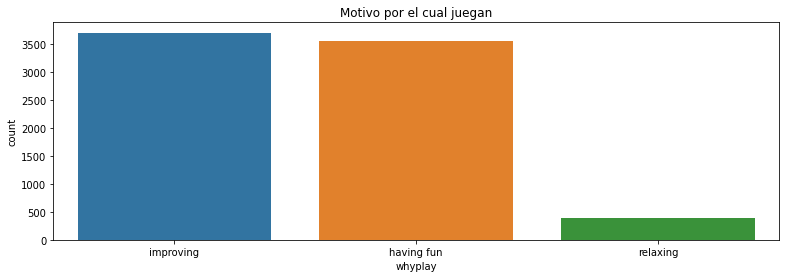

In [454]:
plt.figure(figsize=(13, 4))
plt.title("Motivo por el cual juegan")
sns.countplot(x = df_league_of_legends.whyplay.dropna(), order = df_league_of_legends.whyplay.value_counts().index)

## Bivariado

### Podemos ver una relacion entre la edad y el narcisismo, Segun nuestro dataset a mayor edad mayor es el nivel de narcisimo en la personas

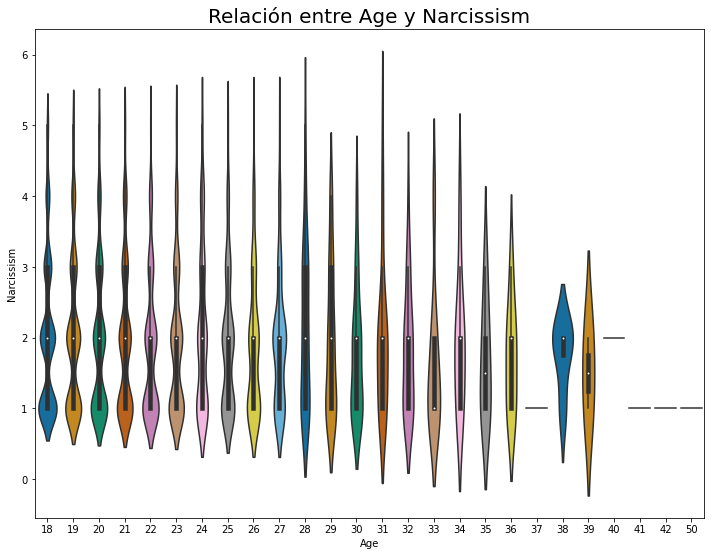

In [455]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.violinplot(x = df_league_of_legends['Age'], y = df_league_of_legends['Narcissism'], palette = 'colorblind')
plt.title('Relación entre Age y Narcissism', fontsize = 20, fontweight = 30)
plt.show()

### Gad: Desorden de ansiedad Generalizada. Podemos ver como se mantiene durante los primero años, pero despues el muestreo disminuye aumentando la media de la variable 

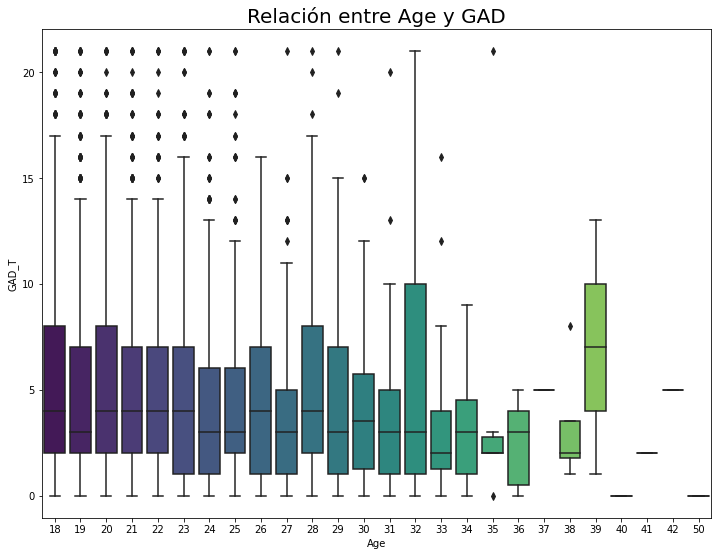

In [456]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.boxplot(x = df_league_of_legends['Age'], y = df_league_of_legends['GAD_T'], palette = 'viridis')
plt.title('Relación entre Age y GAD', fontsize = 20)
plt.show()

### Spin: Fobia social. Podemos ver que en este trastorno la media umneta considerablemente en comparacion con la ansiedad. Teniendo en cuenta que presenta mas outliers en los primeros años 

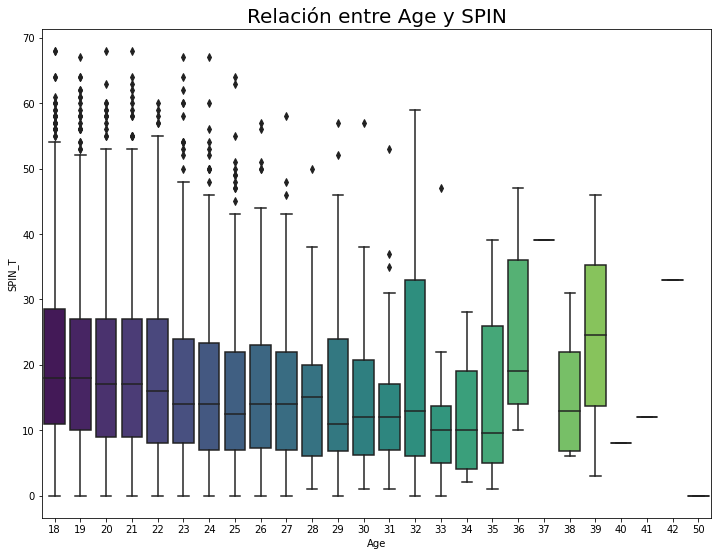

In [457]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.boxplot(x = df_league_of_legends['Age'], y = df_league_of_legends['SPIN_T'], palette = 'viridis')
plt.title('Relación entre Age y SPIN', fontsize = 20)
plt.show()

## Multivariado

<h3>Podemos ver como los jovenes de entre 20 a 30 años son mas propensos a jugar mas de 40 horas a la semana, en su mayoria siendo o estudiantes o desempleados.</h3>

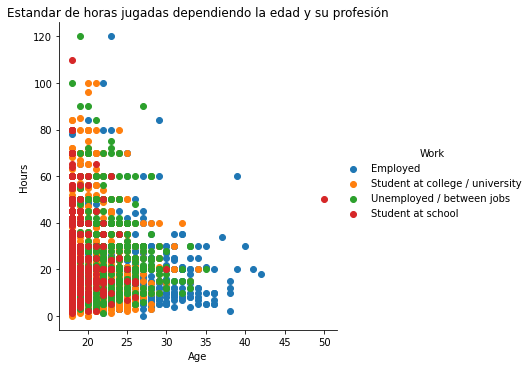

In [458]:
sns.FacetGrid(df_league_of_legends, hue = 'Work', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.title('Estandar de horas jugadas dependiendo la edad y su profesión')

plt.show()

<h3>Recordemos que "SWL_T" es la satifacción total con la vida, por lo que la siguiente gráfica se leería de la siguiente manera:</h3> <br>
1: es extremadamente insatisfecho con la vida. <br>
4: Es extremanadamente satisfecho con la vida

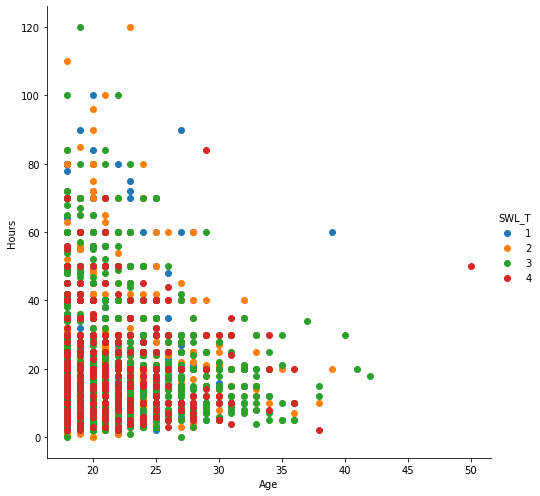

In [459]:
import decimal

df_league_of_legends['SWL_T'] = df_league_of_legends.SWL_T.div(10).apply(np.ceil).apply(
  lambda x: decimal.Decimal(x).to_integral_value(rounding=decimal.ROUND_HALF_UP)
)

sns.FacetGrid(df_league_of_legends, hue = 'SWL_T', height = 7).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

<h3>Recordemos que "SPIN_T" es la fobia social total, por lo que la siguiente gráfica se leería de la siguiente manera:</h3> <br>
0: Es nulo problema para poder socializar. <br>
7: Es imposibilidad absoluta para convivir con otros humanos

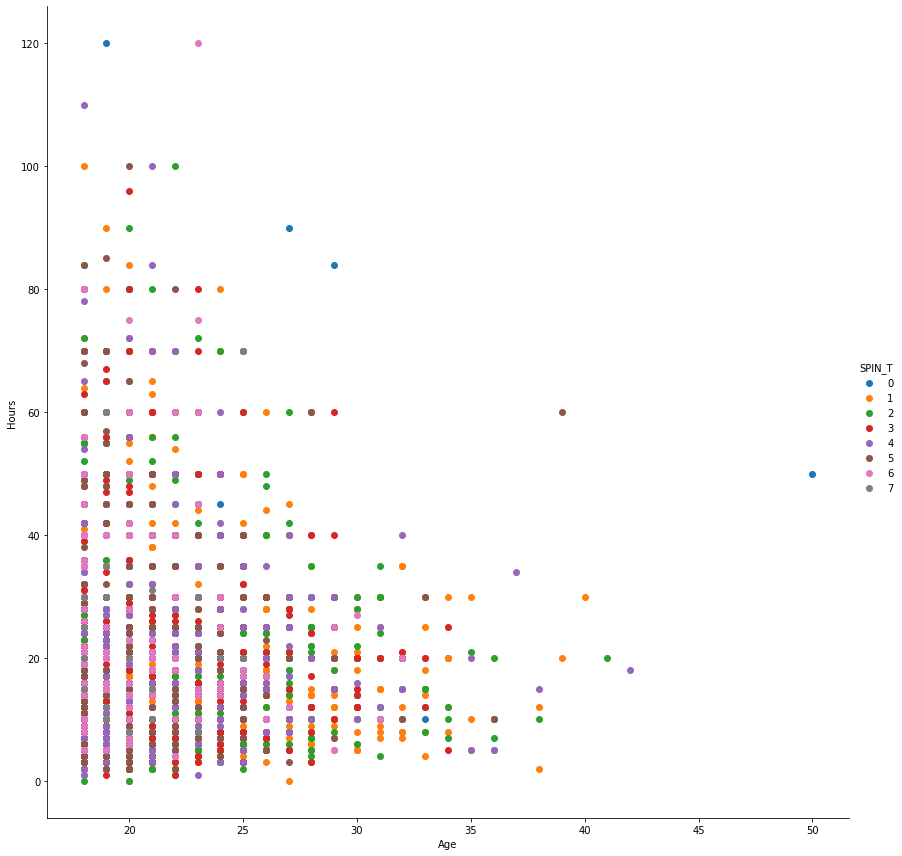

In [460]:
import decimal

df_league_of_legends['SPIN_T'] = df_league_of_legends.SPIN_T.div(10).apply(np.ceil).apply(
  lambda x: decimal.Decimal(x).to_integral_value(rounding=decimal.ROUND_HALF_UP)
)

sns.FacetGrid(df_league_of_legends, hue = 'SPIN_T', height = 12).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

<h3>Recordemos que "GAD_T" es desorden de axiedad generalidaza total, por lo que la siguiente gráfica se leería de la siguiente manera:</h3> <br>
0: Es nula axiedad social. <br>
3: Es absoluta axiedad social, al borde de agorafobia.

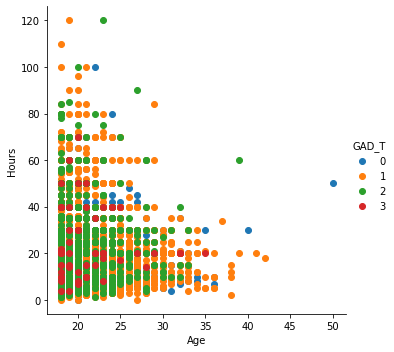

In [461]:
import decimal

df_league_of_legends['GAD_T'] = df_league_of_legends.GAD_T.div(10).apply(np.ceil).apply(
  lambda x: decimal.Decimal(x).to_integral_value(rounding=decimal.ROUND_HALF_UP)
)

sns.FacetGrid(df_league_of_legends, hue = 'GAD_T', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

<h3>Procedemos a ver que relación hay entre los feature escogidos.</h3>

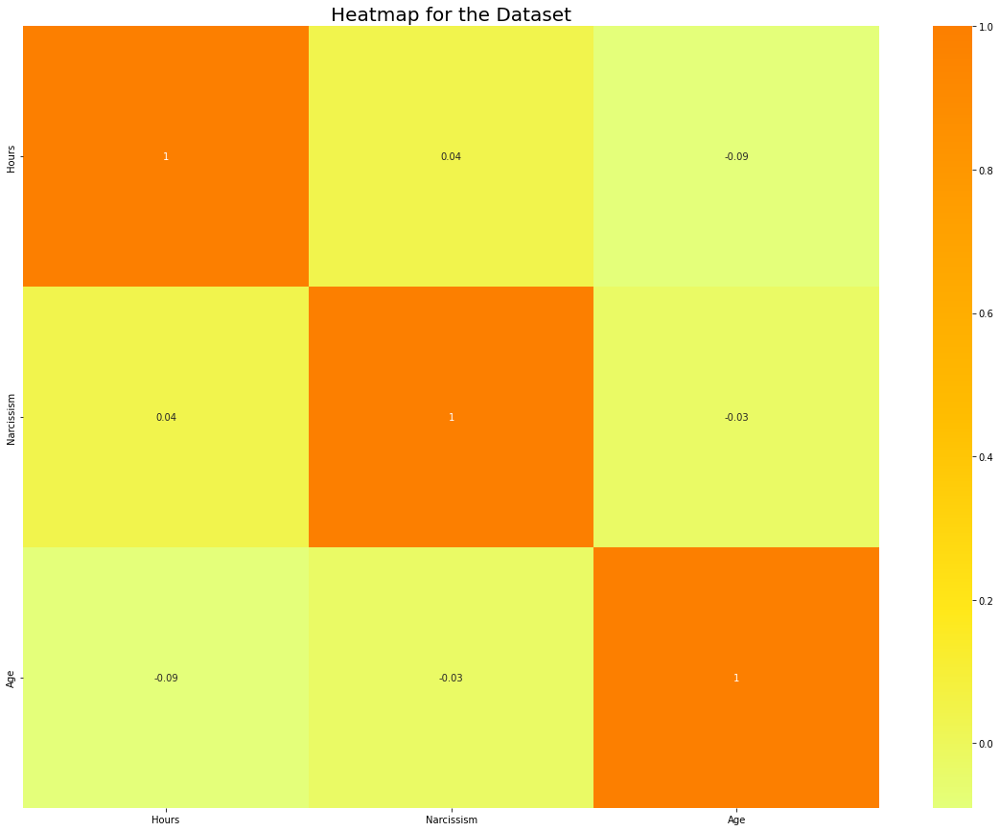

In [462]:
plt.rcParams['figure.figsize'] = (20, 15)
sns.heatmap(df_league_of_legends.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

<h2>Aplicamos el Metodo PCA para grupar los gamers</h2>

In [463]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (17,10)

from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

In [464]:
df_league_of_legends

,Game,Platform,Hours,whyplay,League,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,League of Legends,PC,25,having fun,Gold,1,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,4,1
27,League of Legends,PC,5,having fun,Bronze,3,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,1,3,4
33,League of Legends,PC,9,improving,Silver 4,4,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,3,4
35,League of Legends,PC,7,having fun,Gold,2,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,3,3
48,League of Legends,PC,25,improving,Unranked - Low ELO,3,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13450,League of Legends,PC,15,having fun,gold 3,2,21,Student at college / university,Bachelor (or equivalent),Croatia,Multiplayer - online - with real life friends,1,3,1
13452,League of Legends,PC,10,having fun,Silver V,1,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,1,2,3
13456,League of Legends,PC,12,relaxing,Gold 3,3,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,1,4,1
13457,League of Legends,PC,15,improving,silver,1,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,1,1,4


In [465]:
x= df_league_of_legends[['GAD_T','Age','Hours']].values
y = df_league_of_legends['Age']

In [466]:
distortions = []
for i in range(1, 11):
    km = KMeans(
        n_clusters=i,
        max_iter=300,
        random_state=0
    )
    km.fit(x)
    distortions.append(km.inertia_)


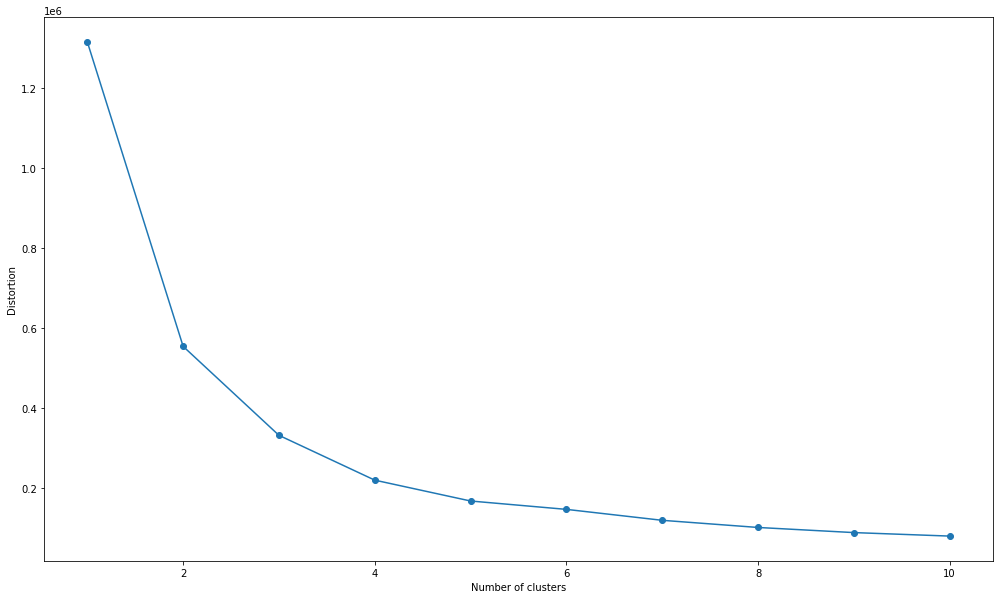

In [467]:
# plot
plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

<h2>Creamos el modelo con la cantidad de Clusters adecuadas</h2>

In [468]:
kmeans = KMeans(n_clusters=5).fit(x)
centroids = kmeans.cluster_centers_
print(centroids)

[[ 1.01160093 20.54814385 28.84570766]
 [ 0.99678457 20.76623794 18.00514469]
 [ 1.07704655 20.01605136 43.86677368]
 [ 0.9925669  21.12983152  8.67294351]
 [ 1.12121212 20.38181818 69.03636364]]


<h2>Entrenamos el modelo y realizacion la prediccion</h2>

Text(0.5, 0.5, 'Edad')

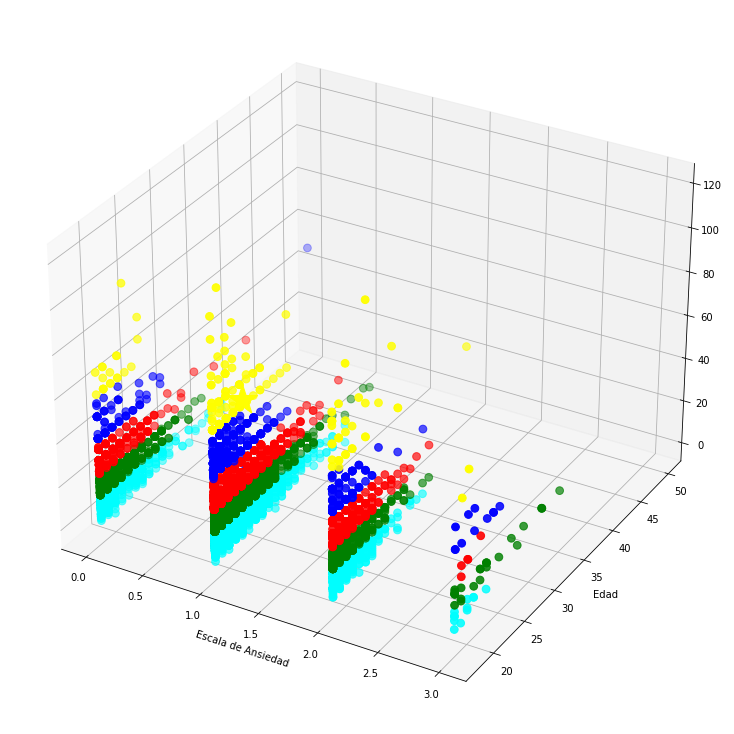

In [469]:
# Predicting the clusters
labels = kmeans.predict(x)
# Getting the cluster centers
C = kmeans.cluster_centers_
colores=['red','green','blue','cyan','yellow']
asignar=[]
for row in labels:
    asignar.append(colores[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(x[:, 0], x[:, 1], x[:, 2], c=asignar,s=60)
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c=colores, s=1000)
plt.xlabel('Escala de Ansiedad')
plt.ylabel('Edad')


In [470]:
x2= df_league_of_legends[['SWL_T','SPIN_T']].values
y2 = df_league_of_legends['GAD_T']

df_league_of_legends

,Game,Platform,Hours,whyplay,League,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,League of Legends,PC,25,having fun,Gold,1,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,4,1
27,League of Legends,PC,5,having fun,Bronze,3,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,1,3,4
33,League of Legends,PC,9,improving,Silver 4,4,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,3,4
35,League of Legends,PC,7,having fun,Gold,2,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,3,3
48,League of Legends,PC,25,improving,Unranked - Low ELO,3,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13450,League of Legends,PC,15,having fun,gold 3,2,21,Student at college / university,Bachelor (or equivalent),Croatia,Multiplayer - online - with real life friends,1,3,1
13452,League of Legends,PC,10,having fun,Silver V,1,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,1,2,3
13456,League of Legends,PC,12,relaxing,Gold 3,3,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,1,4,1
13457,League of Legends,PC,15,improving,silver,1,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,1,1,4


In [471]:
#Separamos en train y test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x2, y2, test_size=0.2, random_state=0)

In [472]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [473]:
X_test[0:3]

array([[ 0.70488922, -0.27689146],
       [ 0.70488922, -1.03308476],
       [ 0.70488922, -0.27689146]])

In [474]:
X_train[0:3]

array([[-0.58850103, -1.03308476],
       [-0.58850103, -1.03308476],
       [-0.58850103,  0.47930184]])

In [475]:
from sklearn.decomposition import PCA

pca = PCA()

In [476]:
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
X_train

array([[-0.31436818, -1.14663431],
       [-0.31436818, -1.14663431],
       [ 0.75505065, -0.07721548],
       ...,
       [-0.69422378,  0.30264012],
       [ 0.37519505,  1.37205894],
       [-1.22893319, -0.2320693 ]])

In [477]:
from sklearn.ensemble import RandomForestClassifier

# Creación del modelo
model_rf = RandomForestClassifier(max_depth=2, random_state=0)
model_rf.fit(X_train, y_train)

# Predicción
y_pred = model_rf.predict(X_test)

ValueError: Unknown label type: 'unknown'

In [ ]:
#Evaluación básica del modelo
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print('El accuracy del modelo es:', accuracy)

El accuracy del modelo es: 0.1531413612565445


<h2>Conclusión: Podemos ver como este modelo da una predicción bastante mejorable, es lo que estaremos realizando en la siguiente iteración: Optimizar el modelo.</h2>

# Para Optimizar nuestro modelo utilizamos Xgboost

In [ ]:
import xgboost as xgb
from sklearn.linear_model import LinearRegression as LR
from sklearn.model_selection import train_test_split
from warnings import filterwarnings
filterwarnings('ignore')

mOptimizado = pd.read_csv('./Datasets/Gaming-anxiety.csv', encoding= 'unicode_escape')
mOptimizado

,S. No.,Timestamp,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7,GADE,...,Birthplace,Residence,Reference,Playstyle,accept,GAD_T,SWL_T,SPIN_T,Residence_ISO3,Birthplace_ISO3
0,1,42052.00437,0,0,0,0,1,0,0,Not difficult at all,...,USA,USA,Reddit,Singleplayer,Accept,1,23,5.0,USA,USA
1,2,42052.00680,1,2,2,2,0,1,0,Somewhat difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,8,16,33.0,USA,USA
2,3,42052.03860,0,2,2,0,0,3,1,Not difficult at all,...,Germany,Germany,Reddit,Singleplayer,Accept,8,17,31.0,DEU,DEU
3,4,42052.06804,0,0,0,0,0,0,0,Not difficult at all,...,USA,USA,Reddit,Multiplayer - online - with online acquaintanc...,Accept,0,17,11.0,USA,USA
4,5,42052.08948,2,1,2,2,2,3,2,Very difficult,...,USA,South Korea,Reddit,Multiplayer - online - with strangers,Accept,14,14,13.0,KOR,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,14246,42057.75678,1,0,0,1,0,1,1,Not difficult at all,...,France,France,Reddit,Multiplayer - online - with strangers,Accept,4,28,7.0,FRA,FRA
13460,14247,42057.81185,3,3,3,3,2,3,3,Extremely difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,20,23,25.0,USA,USA
13461,14248,42058.16964,0,0,0,0,0,0,0,Not difficult at all,...,Norway,Norway,Reddit,Multiplayer - online - with real life friends,Accept,0,32,10.0,NOR,NOR
13462,14249,42058.24420,3,2,1,3,0,1,3,Somewhat difficult,...,Canada,Canada,Reddit,Singleplayer,Accept,13,16,32.0,CAN,CAN


In [ ]:
mOptimizado = mOptimizado.drop(columns=[
    'Game',
    'Platform',
    'whyplay',
    'League',
    'Work',
    'Degree',
    'Residence',
    'Playstyle',
    'earnings',
    'Reference',
    'accept',
    'Birthplace_ISO3',
    'Residence_ISO3',
    'Timestamp',
    'Birthplace',
    'highestleague',
    'streams',
    'S. No.',
    'Gender',
    'GAD1',          
    'GAD2',          
    'GAD3',          
    'GAD4',          
    'GAD5',          
    'GAD6',     
    'GAD7',          
    'GADE',          
    'SWL1',          
    'SWL2',          
    'SWL3',          
    'SWL4',         
    'SWL5',
    'SPIN1',         
    'SPIN2',         
    'SPIN3',         
    'SPIN4',         
    'SPIN5',         
    'SPIN6',         
    'SPIN7',         
    'SPIN8',         
    'SPIN9',         
    'SPIN10',        
    'SPIN11',        
    'SPIN12',        
    'SPIN13',        
    'SPIN14',        
    'SPIN15',        
    'SPIN16',        
    'SPIN17',
])

In [ ]:
# Quitamos los outlayers
mOptimizado = mOptimizado[mOptimizado['Hours'] < 300]
mOptimizado

,Hours,Narcissism,Age,GAD_T,SWL_T,SPIN_T
0,15.0,1.0,25,1,23,5.0
1,8.0,1.0,41,8,16,33.0
2,0.0,4.0,32,8,17,31.0
3,20.0,2.0,28,0,17,11.0
4,20.0,1.0,19,14,14,13.0
...,...,...,...,...,...,...
13459,40.0,3.0,22,4,28,7.0
13460,20.0,2.0,20,20,23,25.0
13461,20.0,2.0,19,0,32,10.0
13462,5.0,2.0,18,13,16,32.0


<h3>Vamos a hacer un problema de clasificacion. Asi que lo que vamos a predecir que tan grave es el GAD. Tomaremos el 21 como umbral mas grave de esta condición y menor a este menos grave.</h3>

In [ ]:
mOptimizado.loc[mOptimizado['GAD_T'] < 21, 'GAD_T'] = 0 #menos grave
mOptimizado.loc[mOptimizado['GAD_T'] >= 21, 'GAD_T'] = 1 #muy grave

In [ ]:
mOptimizado

,Hours,Narcissism,Age,GAD_T,SWL_T,SPIN_T
0,15.0,1.0,25,0,23,5.0
1,8.0,1.0,41,0,16,33.0
2,0.0,4.0,32,0,17,31.0
3,20.0,2.0,28,0,17,11.0
4,20.0,1.0,19,0,14,13.0
...,...,...,...,...,...,...
13459,40.0,3.0,22,0,28,7.0
13460,20.0,2.0,20,0,23,25.0
13461,20.0,2.0,19,0,32,10.0
13462,5.0,2.0,18,0,16,32.0


In [ ]:
X = mOptimizado.drop("GAD_T", axis=1) #Elimino de mi dataset la variable a predecir
y = mOptimizado.GAD_T #Defino el Target

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=123)

In [ ]:
clf_xgb = xgb.XGBClassifier(objective='binary:logistic', eval_metric = 'error', n_estimators=10, seed=123)

In [ ]:
clf_xgb.fit(X_train,y_train); #Entrenamos el modelo

In [ ]:
y_train_pred = clf_xgb.predict(X_train) #Prediccion en Train
y_test_pred = clf_xgb.predict(X_test) #Prediccion en Test

In [ ]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Train
train_accuracy = accuracy_score(y_train, y_train_pred)

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de entrenamiento:', train_accuracy)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de entrenamiento: 0.9922754769660307
% de aciertos sobre el set de evaluación: 0.9895794566430964
